# **Sensing, Perception, and Actuation Course**
Ahmad Hamdan 

[GitHub](https://github.com/ahmad12hamdan99/SPA.git)

# Camera calibration



In [137]:
import numpy as np
import cv2
from glob import glob
import matplotlib.pyplot as plt



In [138]:
square_size = 20
img_mask = "imgs/*.jpg"
pattern_size = (26, 18)

figsize = (20, 20)


In [139]:

img_names = glob(img_mask)
num_images = len(img_names)

pattern_points = np.zeros((np.prod(pattern_size), 3), np.float32)
pattern_points[:, :2] = np.indices(pattern_size).T.reshape(-1, 2)
pattern_points *= square_size
obj_points = []
img_points = []
h, w = cv2.imread(img_names[0]).shape[:2]
print(h,w)



1280 958


## Step 1: find all corners in calibration plane


processing imgs/photo_17_2022-12-09_18-03-32.jpg... 


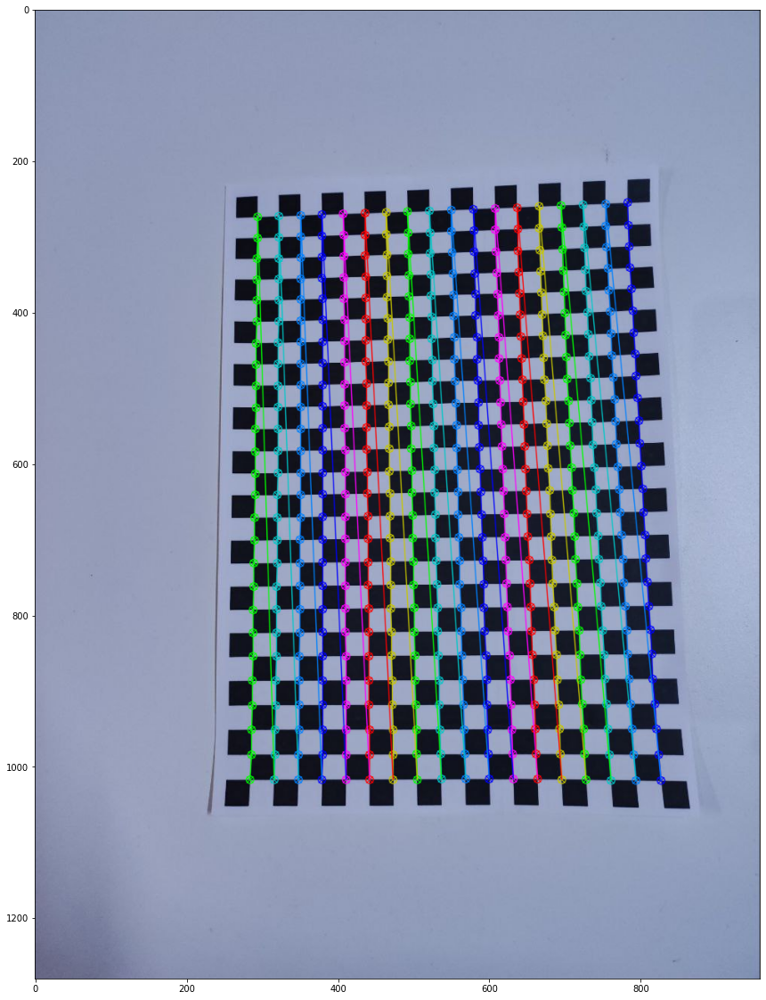

imgs/photo_17_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_21_2022-12-09_18-03-32.jpg... 


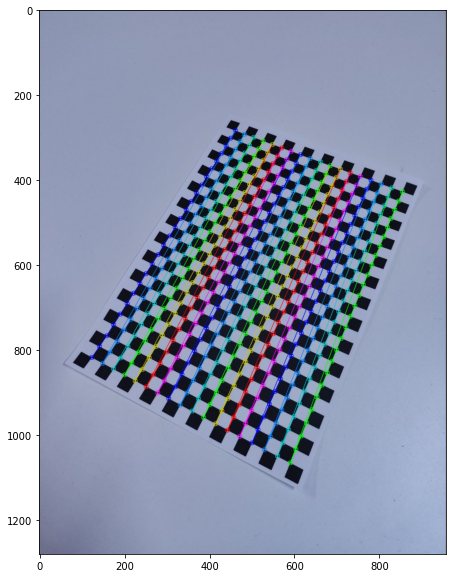

imgs/photo_21_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_13_2022-12-09_18-03-32.jpg... 


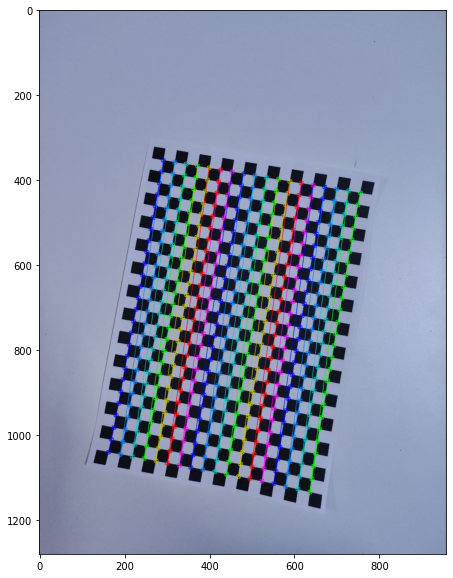

imgs/photo_13_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_6_2022-12-09_18-03-32.jpg... 


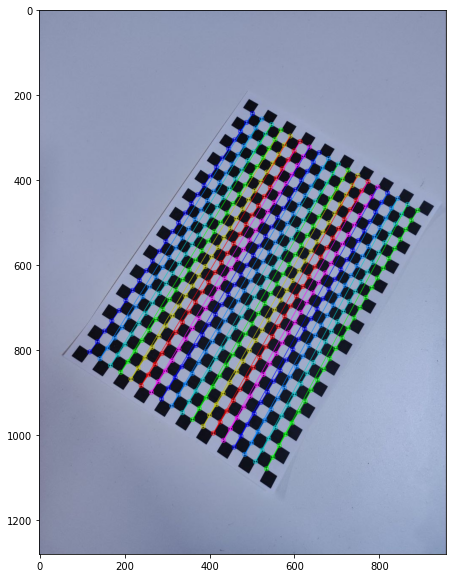

imgs/photo_6_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_15_2022-12-09_18-03-32.jpg... 


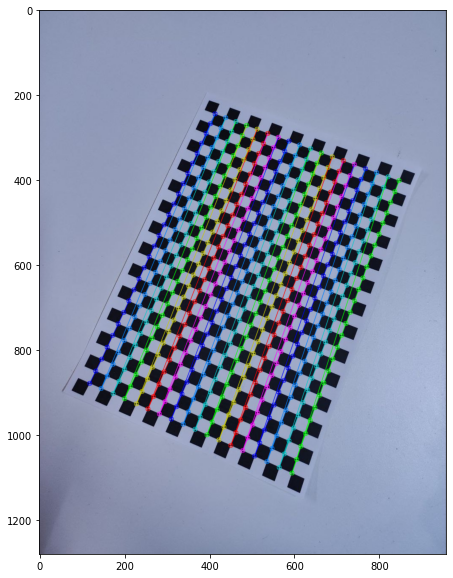

imgs/photo_15_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_7_2022-12-09_18-03-32.jpg... 


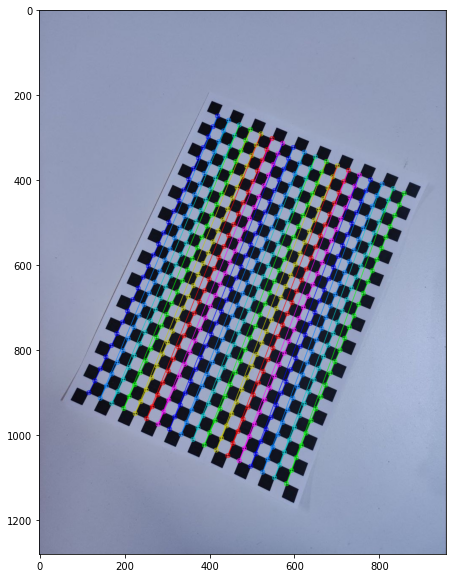

imgs/photo_7_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_20_2022-12-09_18-03-32.jpg... 


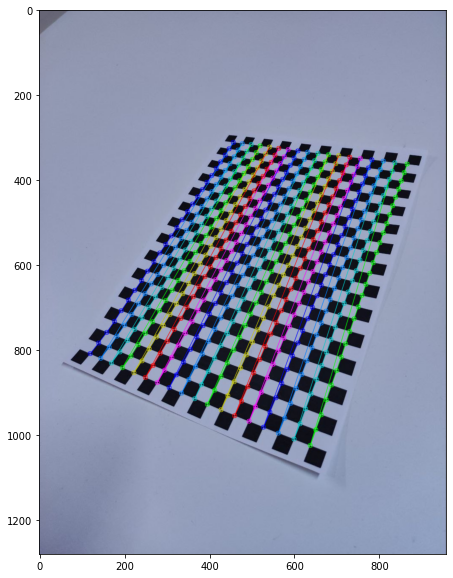

imgs/photo_20_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_2_2022-12-09_18-03-32.jpg... 


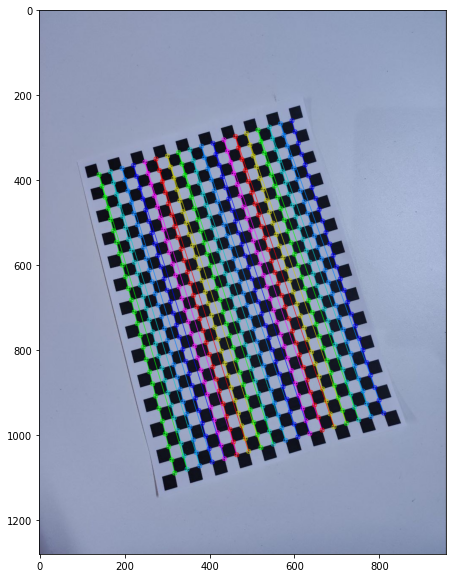

imgs/photo_2_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_1_2022-12-09_18-03-32.jpg... 


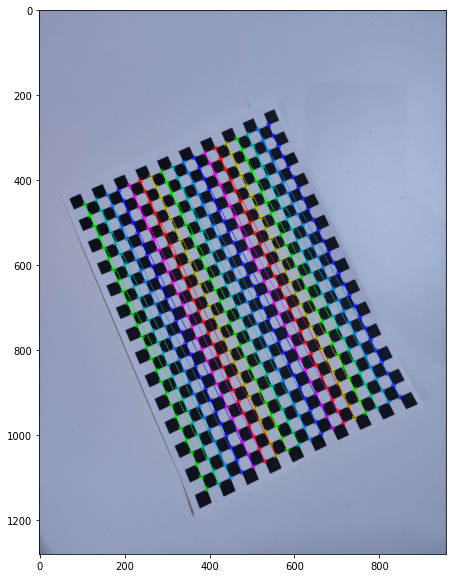

imgs/photo_1_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_14_2022-12-09_18-03-32.jpg... 


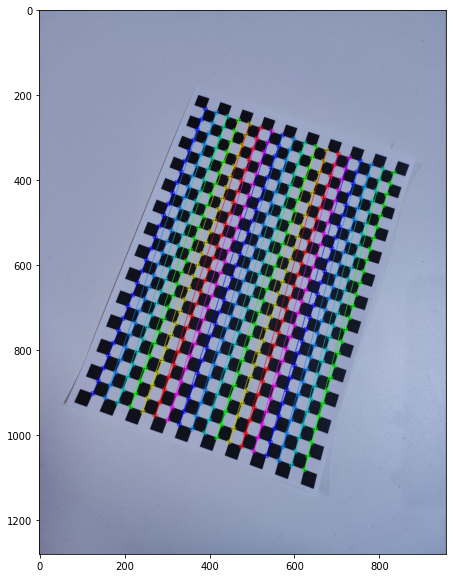

imgs/photo_14_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_11_2022-12-09_18-03-32.jpg... 


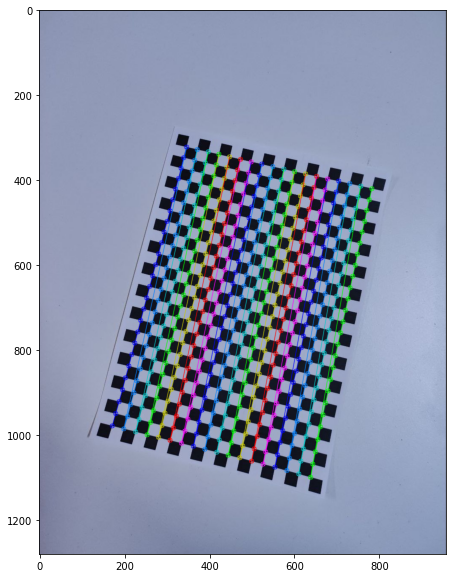

imgs/photo_11_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_16_2022-12-09_18-03-32.jpg... 


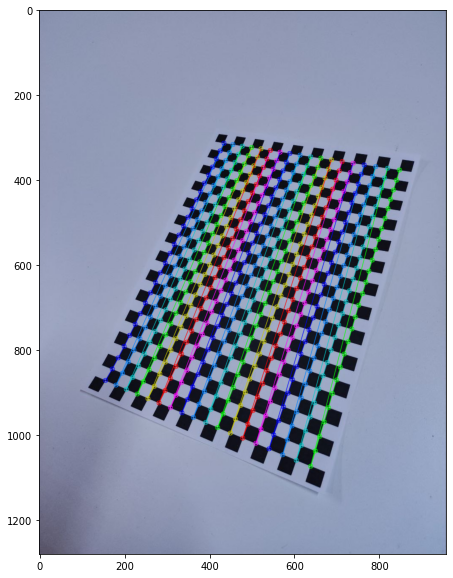

imgs/photo_16_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_18_2022-12-09_18-03-32.jpg... 


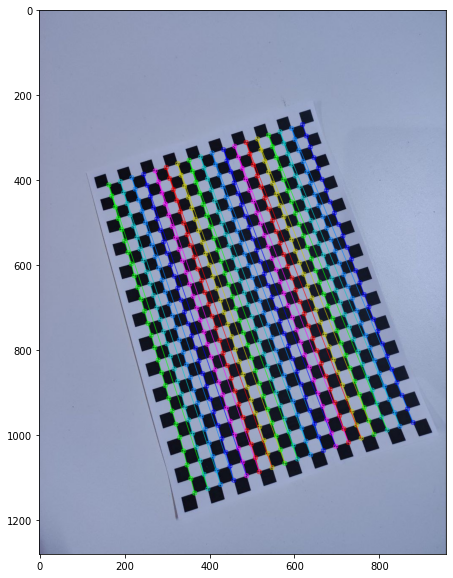

imgs/photo_18_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_10_2022-12-09_18-03-32.jpg... 


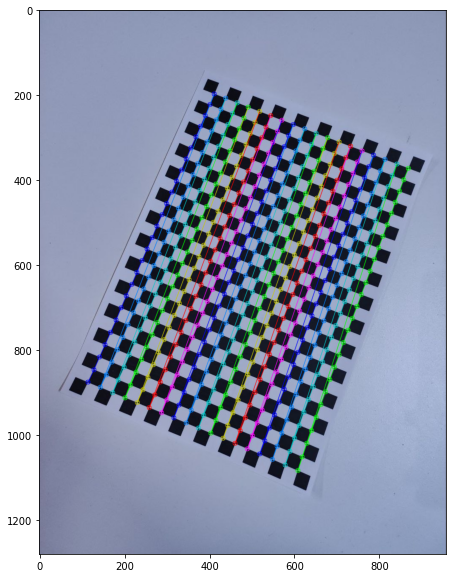

imgs/photo_10_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_12_2022-12-09_18-03-32.jpg... 


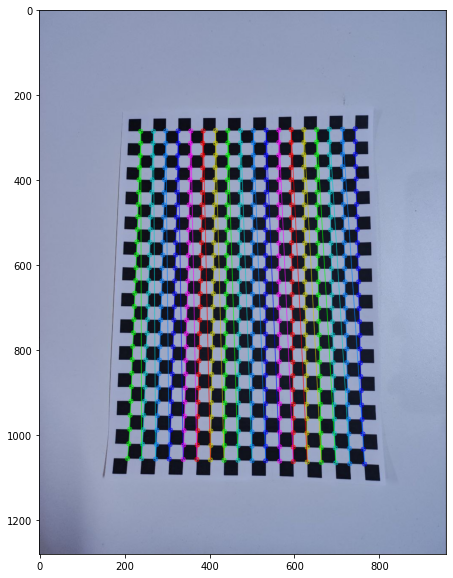

imgs/photo_12_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_9_2022-12-09_18-03-32.jpg... 


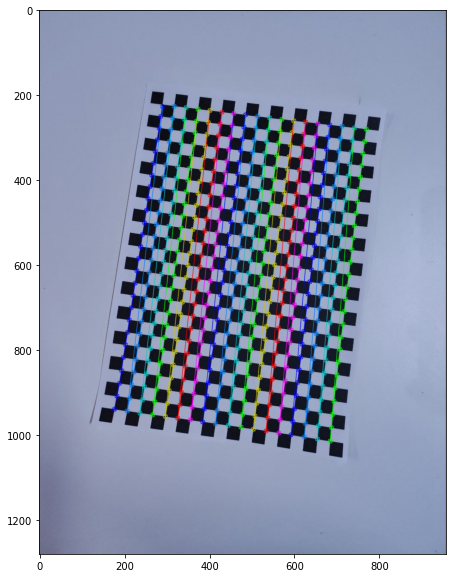

imgs/photo_9_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_5_2022-12-09_18-03-32.jpg... 


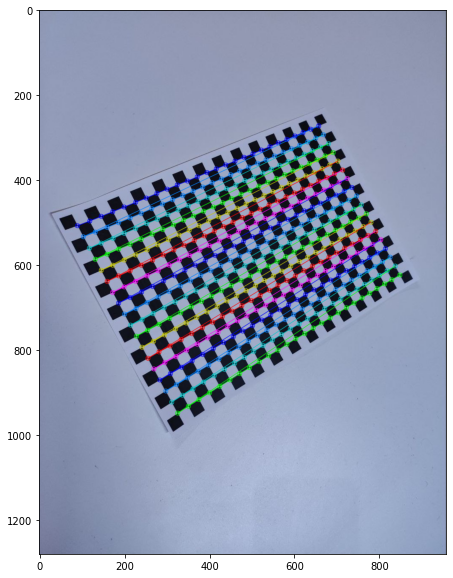

imgs/photo_5_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_8_2022-12-09_18-03-32.jpg... 


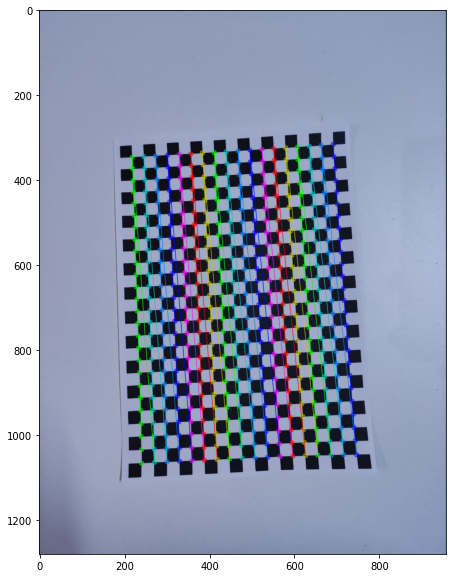

imgs/photo_8_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_3_2022-12-09_18-03-32.jpg... 


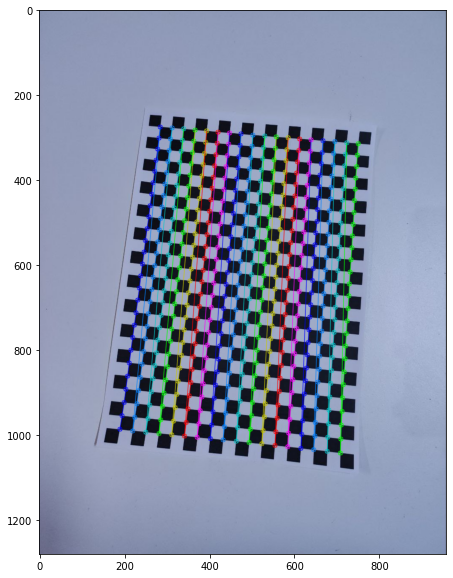

imgs/photo_3_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_4_2022-12-09_18-03-32.jpg... 


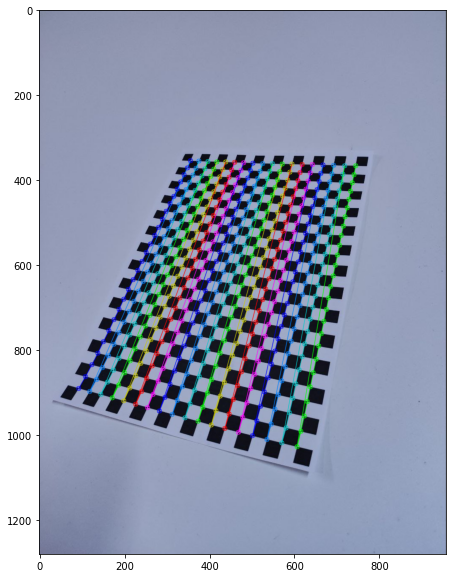

imgs/photo_4_2022-12-09_18-03-32.jpg... OK
processing imgs/photo_19_2022-12-09_18-03-32.jpg... 


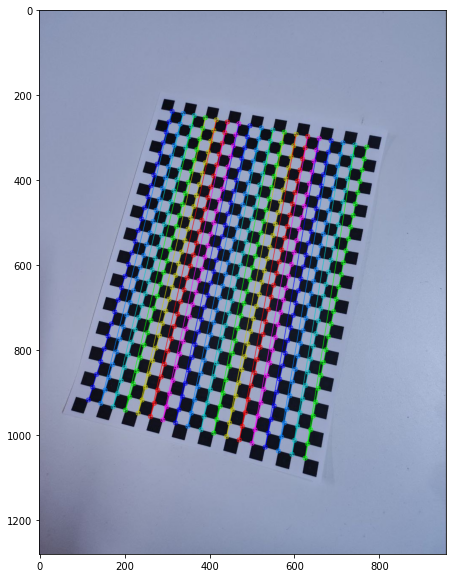

imgs/photo_19_2022-12-09_18-03-32.jpg... OK


In [140]:
plt.figure(figsize=figsize)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

for i, fn in enumerate(img_names):
    print("processing %s... " % fn)
    imgBGR = cv2.imread(fn)

    if imgBGR is None:
        print("Failed to load", fn)
        continue

    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(imgRGB, cv2.COLOR_BGR2GRAY)

    # Finds the positions of internal corners of the chessboard.
    # image	Source chessboard view. It must be an 8-bit grayscale or color image.
    # patternSize	Number of inner corners per a chessboard row and column.
    # corners	Output array of detected corners.

    found, corners = cv2.findChessboardCorners(img, pattern_size)

    if not found:
        print("chessboard not found")
        continue
    # refining pixel coordinates for given 2d points.
    corners2 = cv2.cornerSubPix(img, corners, (5,5),(-1,-1), criteria)
      

    # Draw and display the corners  

    img_w_corners = cv2.drawChessboardCorners(imgRGB, pattern_size, corners2, found)
    plt.plot()
    plt.imshow(img_w_corners)
    plt.show()

    print(f"{fn}... OK")
    img_points.append(corners2)
    obj_points.append(pattern_points)






## Step 2: get camera intrinsics + distortion coeffs
also get extrinsic rotation and translation vectors per image. Rotation vector is another representation for a full R matrix
more on it here: https://en.wikipedia.org/wiki/Rodrigues%27_rotation_formula


In [141]:
# calculate camera distortion
rms, camera_matrix, dist_coefs, _rvecs, _tvecs = cv2.calibrateCamera(obj_points, img_points, (w, h), None, None)

print("\nRMS:", rms)
print("camera matrix:\n", camera_matrix)
print("distortion coefficients: ", dist_coefs.ravel())




RMS: 0.6746015385222525
camera matrix:
 [[960.27285427   0.         477.11209944]
 [  0.         963.10193816 620.68955922]
 [  0.           0.           1.        ]]
distortion coefficients:  [ 1.28317365e-01 -5.45304417e-01 -3.54374961e-03 -7.43023339e-04
  1.16264983e+00]


In [142]:
mean_error = 0
for i in range(len(obj_points)):
    imgpoints2 = cv2.projectPoints(obj_points[i],  _rvecs[i], _tvecs[i], camera_matrix, dist_coefs)[0]
    error = cv2.norm(img_points[i].reshape(-1,1,2), imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error


print( "total error: {}".format(mean_error/len(obj_points)) )

total error: 0.030547853199343573


## Build undistorted images


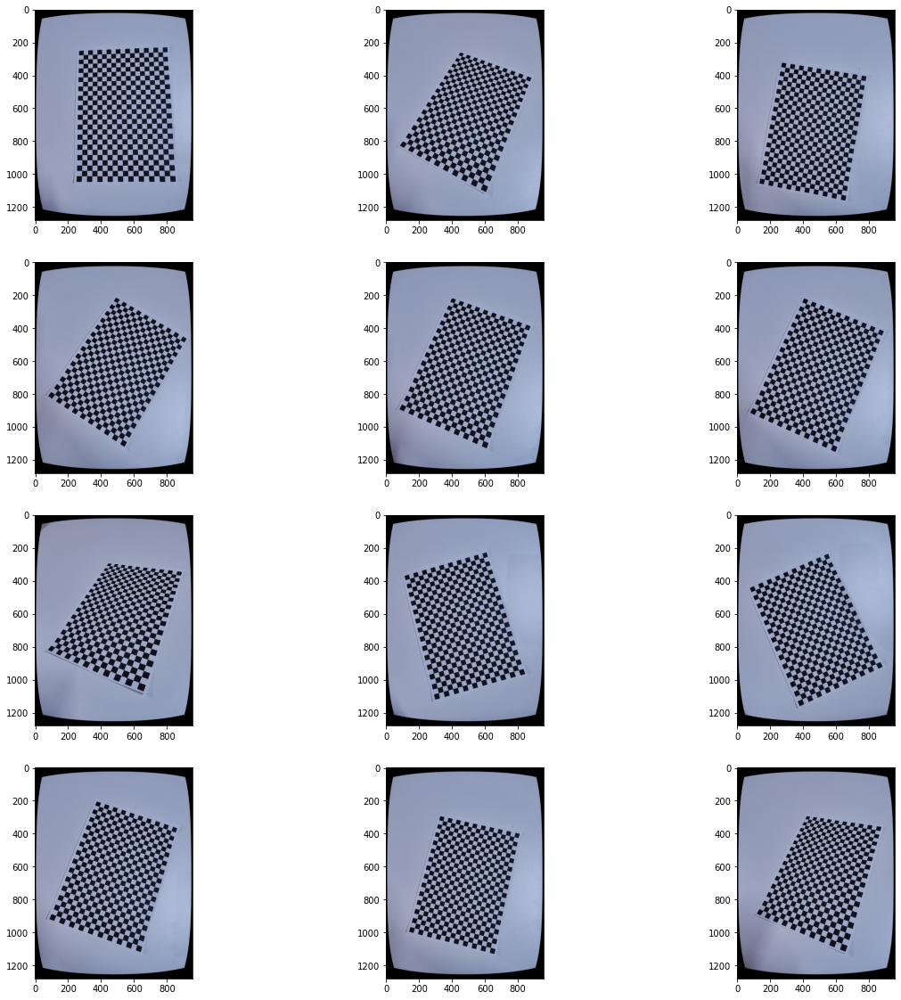

Done


In [143]:
# undistort the image with the calibration
plt.figure(figsize=figsize)
for i, fn in enumerate(img_names):

    imgBGR = cv2.imread(fn)
    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(imgRGB, camera_matrix, dist_coefs)

    if i < 12:
        plt.subplot(4, 3, i + 1)
        plt.imshow(dst)

plt.show()
print("Done")



## Example for full projection from 3D to 2D of a cube


<ipython-input-144-e13208fe8ef5>:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  objectPoints =(3*square_size* np.array([[0, 0, 0], [0, 1, 0], [1, 1, 0], [1, 0, 0], [0, 0, -1], [0, 1, -1], [1, 1, -1], [1, 0, -1]], dtype=np.float))


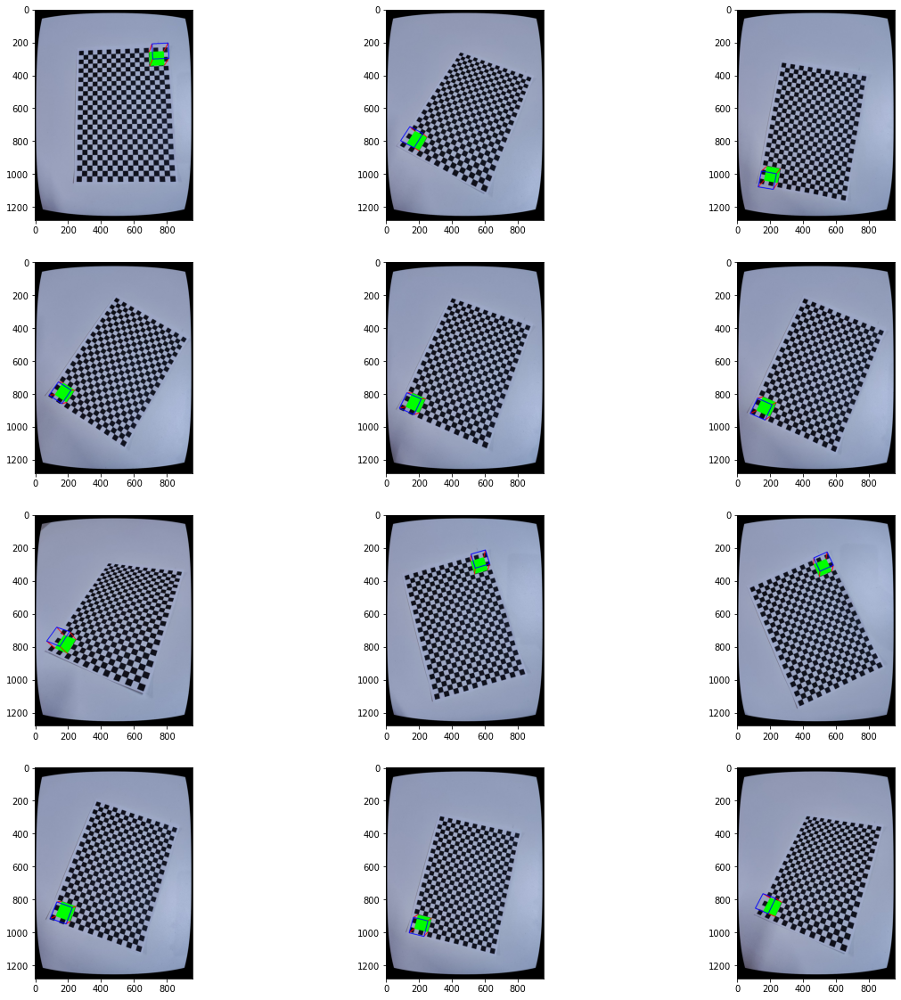

In [144]:
objectPoints =(3*square_size* np.array([[0, 0, 0], [0, 1, 0], [1, 1, 0], [1, 0, 0], [0, 0, -1], [0, 1, -1], [1, 1, -1], [1, 0, -1]], dtype=np.float))


def draw(img, imgpts):
    imgpts = np.int32(imgpts).reshape(-1, 2)

    # draw ground floor in green
    img = cv2.drawContours(img, [imgpts[:4]], -1, (0, 255, 0), -1)

    # draw pillars in blue color
    for i, j in zip(range(4), range(4, 8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]), (255), 3)

    # draw top layer in red color
    img = cv2.drawContours(img, [imgpts[4:]], -1, (0, 0, 255), 3)

    return img


plt.figure(figsize=figsize)
for i in range(min(len(img_names),len(_rvecs))):

    imgBGR = cv2.imread(img_names[i])
    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(imgRGB, camera_matrix, dist_coefs)
    imgpts = cv2.projectPoints(objectPoints, _rvecs[i], _tvecs[i], camera_matrix, dist_coefs)[0]
    drawn_image = draw(dst, imgpts)

    if i < 12:
        plt.subplot(4, 3, i + 1)
        plt.imshow(drawn_image)

plt.show()


In [145]:
# function to read and resize an image
def read_and_resize(filename: str, grayscale: bool = False, fx: float = 1.0, fy: float = 1.0):
    if grayscale:
      img_result = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    else:
      imgbgr = cv2.imread(filename, cv2.IMREAD_COLOR)
      # convert to rgb
      img_result = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)
    # resize
    if fx != 1.0 and fy != 1.0:
      img_result = cv2.resize(img_result, None, fx=fx, fy=fy, interpolation = cv2.INTER_CUBIC)
    return img_result

    
def show_in_row(list_of_images: list, titles: list = None, disable_ticks: bool = False):
  plt.rcParams['figure.figsize'] = (16, 10)
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])
      
    img = list_of_images[idx]
    cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
    subplot.imshow(img, cmap=cmap)
    if disable_ticks:
      plt.xticks([]), plt.yticks([])
  plt.show()

# Finding Dimensions of the object

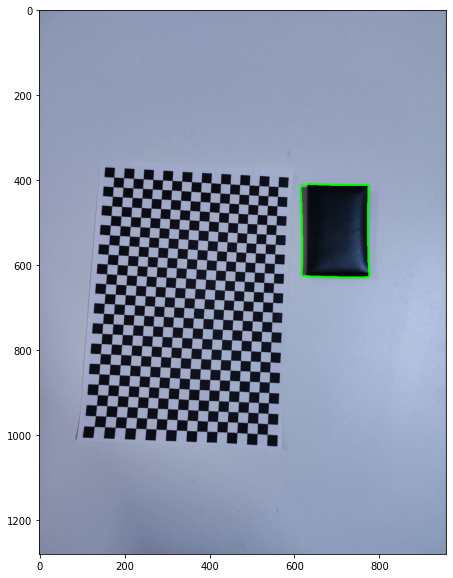

In [146]:
im = read_and_resize('test.jpg')
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 140, 255, 0)
contours , hierarchy= cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnt = sorted(contours, key=cv2.contourArea, reverse=True)
im2 = im.copy()
#show_in_row([thresh])

cv2.drawContours(im2, cnt, 2, (0,255,0), 3)
show_in_row([im2])

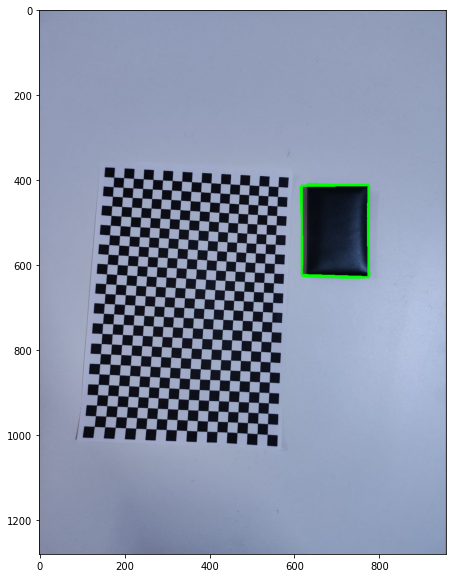

In [147]:
# converting contours to polygons
e = 0.04*cv2.arcLength(cnt[2],True)
approx = cv2.approxPolyDP(cnt[2],e,True)

cv2.drawContours(im2, [approx], -1, (0,255,0), 3)
show_in_row([im2])


In [148]:
#print points of the bouding polygon
print(approx)

[[[618 413]]

 [[776 412]]

 [[775 628]]

 [[618 623]]]


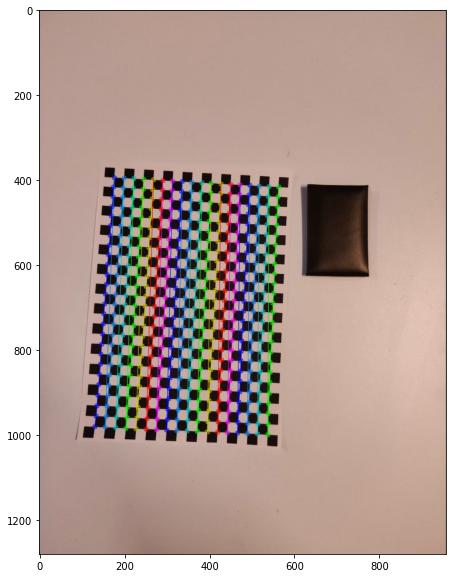

130.69861


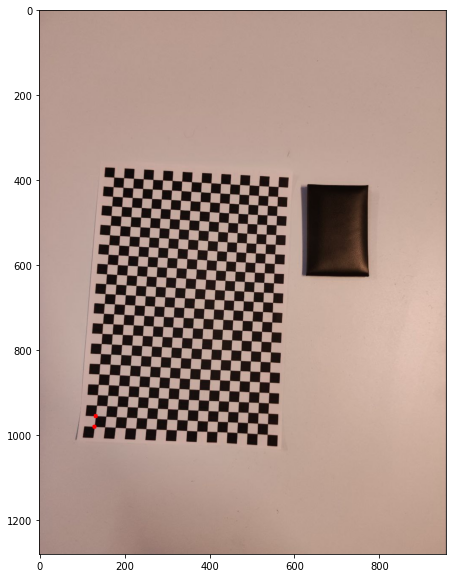

In [149]:
imgBGR = read_and_resize('test.jpg')
imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)
imgcorners = imgRGB.copy()
img = cv2.cvtColor(imgRGB, cv2.COLOR_BGR2GRAY)

# Finds the positions of internal corners of the chessboard.
# image	Source chessboard view. It must be an 8-bit grayscale or color image.
# patternSize	Number of inner corners per a chessboard row and column.
# corners	Output array of detected corners.

found, corners = cv2.findChessboardCorners(img, pattern_size)

if not found:
    print("chessboard not found")

# refining pixel coordinates for given 2d points.
corners2 = cv2.cornerSubPix(img, corners, (5,5),(-1,-1), criteria)
  

# Draw and display the corners  

img_w_corners = cv2.drawChessboardCorners(imgRGB, pattern_size, corners2, found)
plt.plot()
plt.imshow(img_w_corners)
plt.show()
print(corners2[0][0][0])
x, y = corners2[0][0][0], corners2[0][0][1]
cv2.circle(imgcorners, (int(x),int(y)),radius=5, color=(255, 0, 0), thickness=-1)
x1, y1 = corners2[1][0][0], corners2[1][0][1]
cv2.circle(imgcorners, (int(x1),int(y1)),radius=5, color=(255, 0, 0), thickness=-1)
show_in_row([imgcorners])

In [150]:
square_px = y - y1


obj_len_px = 628 - 412
obj_width_px = 775 - 618

obj_len = obj_len_px * 11 / square_px
obj_width = obj_width_px * 11 / square_px
print('real len in mm: ', obj_len)
print('real width in mm: ',obj_width)
print('Very close results to the real values: 99 and 66')

real len in mm:  94.83417095220578
real width in mm:  68.93039277544587
Very close results to the real values: 99 and 66


In [151]:
f_x=camera_matrix[0,0]
f_y=camera_matrix[1,1]
   

sensor_width=26 # in mm #camera sensor with 1/2" size with aspect ratio of 4:3
sensor_hieght=26 # in mm
 
F1=f_x*(sensor_width/1280)
F2=f_y*(sensor_hieght/958)
print("focal x: ",f_x)
print("focal y: ",f_y)

#distance_to_object= real dim(mm) * focal length / object dim in pixels
distance_to_object=(94.8*f_x)/(obj_width_px)

print("distance to camera in mm: ",distance_to_object)

focal x:  960.2728542699256
focal y:  963.1019381648288
distance to camera in mm:  579.8335451260442
